# **Data Collection**

In [1]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install -q kagglehub

In [3]:
from google.colab import files
import os
import kagglehub

# Step 1: Upload kaggle.json manually
print("📂 Please upload your kaggle.json file:")
uploaded = files.upload()

# Ensure the uploaded file exists
if "kaggle.json" not in uploaded:
    print("❌ kaggle.json upload failed. Please try again.")
else:
    # Step 2: Move the file to the correct location
    !mkdir -p /root/.config/kaggle
    !mv kaggle.json /root/.config/kaggle/

    # Step 3: Set proper permissions (read and write)
    !chmod 600 /root/.config/kaggle/kaggle.json

    # Step 4: Verify that the file exists
    if os.path.exists("/root/.config/kaggle/kaggle.json"):
        print("✅ kaggle.json uploaded and set up correctly!")
    else:
        print("❌ kaggle.json upload failed. Please check the file path.")

# Step 5: download dataset
try:
    dataset_path = kagglehub.dataset_download("evilspirit05/cocococo-dataset")
    print("✅ Dataset downloaded successfully!")
    print("📂 Path to dataset files:", dataset_path)

    # Step 7: Move dataset to /content/{dataset-name} for easier access
    target_path = os.path.join(os.getcwd(), "coco_dataset")
    !mkdir -p {target_path}  # Ensure target directory exists
    !cp -r {dataset_path}/* {target_path}/

    print(f"✅ Dataset moved to {target_path}")
    print("📂 Final Dataset contents:", os.listdir(target_path))

except Exception as e:
    print("❌ Error downloading dataset:", e)

📂 Please upload your kaggle.json file:


Saving kaggle.json to kaggle.json
✅ kaggle.json uploaded and set up correctly!
✅ Dataset downloaded successfully!
📂 Path to dataset files: /kaggle/input/cocococo-dataset
✅ Dataset moved to /content/coco_dataset
📂 Final Dataset contents: ['README.dataset.txt', 'export', 'README.roboflow.txt']


In [4]:
import os

base_path = '/content/coco_dataset'  # adjust if needed
export_dir = os.path.join(base_path, 'export')

non_image_files = []

# Walk through export folder
for root, dirs, files in os.walk(export_dir):
    for file in files:
        if not file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff')):
            relative_path = os.path.relpath(os.path.join(root, file), base_path)
            non_image_files.append(relative_path)

# Show all non-image files
if non_image_files:
    print("📄 Non-image files found in 'export':")
    for f in non_image_files:
        print(f"- {f}")
else:
    print("✅ No non-image files found in 'export'")


📄 Non-image files found in 'export':
- export/_annotations.coco.json


In [5]:
import shutil

# Loop through non_image_files and move _annotations.coco.json
for file_path in non_image_files:
    filename = os.path.basename(file_path)
    if filename == '_annotations.coco.json':
        src_path = os.path.join(base_path, file_path)
        dest_path = os.path.join(base_path, filename)
        shutil.move(src_path, dest_path)
        print(f"✅ Moved {src_path} → {dest_path}")


✅ Moved /content/coco_dataset/export/_annotations.coco.json → /content/coco_dataset/_annotations.coco.json


In [6]:
images_path = "/content/coco_dataset/export"
json_path = "/content/coco_dataset/_annotations.coco.json"

verifing data

In [7]:
# Count the number of files
file_count = len([file for file in os.listdir(images_path) if os.path.isfile(os.path.join(images_path, file))])

print(f"Number of files in '{images_path}': {file_count}")

Number of files in '/content/coco_dataset/export': 29800


In [8]:
import json

valid_extensions = {".jpg", ".jpeg", ".png", ".bmp"}

# Check if all files are images
non_image_files = [file for file in os.listdir(images_path)
                   if not any(file.lower().endswith(ext) for ext in valid_extensions)]

if non_image_files:
    print(f"Found non-image files: {non_image_files}")
else:
    print("All files are valid images!")


All files are valid images!


Deleting Unannotated images

In [9]:
# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

# Get all annotated image IDs
annotated_image_ids = {ann['image_id'] for ann in data['annotations']}

# Get all image file names
image_files = {img['file_name']: img['id'] for img in data['images']}

# Identify unannotated images
unannotated = [file for file, img_id in image_files.items() if img_id not in annotated_image_ids]

print(f"\nFound {len(unannotated)} unannotated images.")

# Delete unannotated images
for file in unannotated:
    try:
        file_path = os.path.join(images_path, file)
        os.remove(file_path)
        print(f"Deleted unannotated image: {file}")
    except FileNotFoundError:
        print(f"File not found: {file}")

print("\nDeletion complete!")


Found 3500 unannotated images.
Deleted unannotated image: 1478895384169910818_jpg.rf.684000e1e8f68a2e723485d1d649abb6.jpg
Deleted unannotated image: 1478897734455141074_jpg.rf.686509e5a56a940593a1e56d9ead181e.jpg
Deleted unannotated image: 1478897676755018566_jpg.rf.68749568ca05e6b2b439da2b72d89f85.jpg
Deleted unannotated image: 1478898164636421519_jpg.rf.68c90be17d46a29254f211e200de142b.jpg
Deleted unannotated image: 1478898165208043913_jpg.rf.68f3924e2d2a0796c4373829484f3c54.jpg
Deleted unannotated image: 1478895940606118436_jpg.rf.68xNq7HL27EKmRnrGgpz.jpg
Deleted unannotated image: 1478895984023324459_jpg.rf.691058100352b5ffb50a8eedb5f95f1a.jpg
Deleted unannotated image: 1478896046293760222_jpg.rf.692464726c52b3e2ff622b214ac91978.jpg
Deleted unannotated image: 1478896142270652043_jpg.rf.692d6caddfd1fda42650b775879d4be0.jpg
Deleted unannotated image: 1478901062218872908_jpg.rf.6945df45ba4ddc24f3c58b3d953279b6.jpg
Deleted unannotated image: 1478895838344289010_jpg.rf.6971448a94c306f7

In [10]:
# check after deleting unannotated
file_count = len([file for file in os.listdir(images_path) if os.path.isfile(os.path.join(images_path, file))])

print(f"Number of files in '{images_path}': {file_count}")

Number of files in '/content/coco_dataset/export': 26300


modify json file after deleting unannotated

In [12]:
import json
import os

# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

# Get list of existing images in the directory
existing_images = set(os.listdir(images_path))

# Filter the images list to include only existing files
filtered_images = [img for img in data['images'] if img['file_name'] in existing_images]

# Get the valid image IDs after filtering
valid_image_ids = {img['id'] for img in filtered_images}

# Filter annotations to keep only those belonging to valid images
filtered_annotations = [ann for ann in data['annotations'] if ann['image_id'] in valid_image_ids]

# Update the data dictionary
data['images'] = filtered_images
data['annotations'] = filtered_annotations

# Save the updated JSON file
updated_file = "updated_annotations.coco.json"
with open(updated_file, "w") as outfile:
    json.dump(data, outfile)

print(f"✅ Updated annotation file saved as {updated_file}")

✅ Updated annotation file saved as updated_annotations.coco.json


In [13]:
import os
import shutil

# Define paths
source_file = '/content/updated_annotations.coco.json'  # Current location
destination_dir = '/content/coco_dataset'  # Target directory
destination_file = os.path.join(destination_dir, '_annotations.coco.json')  # New path

# Check if source exists
if not os.path.exists(source_file):
    raise FileNotFoundError(f"Source file not found: {source_file}")

# Ensure destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Move the file (will overwrite if exists)
shutil.move(source_file, destination_file)

print(f"Successfully moved:\n{source_file} → {destination_file}")

Successfully moved:
/content/updated_annotations.coco.json → /content/coco_dataset/_annotations.coco.json


**paths after deleting unannotated images and modifing json**

In [14]:
images_path = "/content/coco_dataset/export"
json_path = "/content/coco_dataset/_annotations.coco.json"

In [15]:
# double check
from collections import defaultdict

with open(json_path, 'r') as f:
    coco_data = json.load(f)

images = coco_data['images']
annotations = coco_data['annotations']

# Map image_id to number of annotations
image_id_to_ann_count = defaultdict(int)
for ann in annotations:
    image_id_to_ann_count[ann['image_id']] += 1

# Check for unannotated images
annotated = []
unannotated = []

for img in images:
    if image_id_to_ann_count[img['id']] > 0:
        annotated.append(img)
    else:
        unannotated.append(img)

print(f"✅ Annotated images: {len(annotated)}")
print(f"❌ Unannotated images: {len(unannotated)}")

✅ Annotated images: 26300
❌ Unannotated images: 0


**EDA**

display classes

In [16]:
import json

# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

# Print basic structure
print("Keys:", data.keys())

# Print a few image entries
print("\nSample Image Entry:")
for image in data["images"][:3]:  # Adjust the number as needed
    print(image)

# Print a few annotation entries
print("\nSample Annotation Entry:")
for annotation in data["annotations"][:3]:
    print(annotation)

# Print category names
print("\nCategories:")
for category in data["categories"]:
    print(category)

Keys: dict_keys(['info', 'licenses', 'categories', 'images', 'annotations'])

Sample Image Entry:
{'id': 0, 'license': 1, 'file_name': '1478897026627294725_jpg.rf.6828a4e821cbab4c2c277d74df291f00.jpg', 'height': 512, 'width': 512, 'date_captured': '2021-06-09T12:24:25+00:00'}
{'id': 2, 'license': 1, 'file_name': '1478900859981702684_jpg.rf.6830635c7d9197475638f0818f5dd103.jpg', 'height': 512, 'width': 512, 'date_captured': '2021-06-09T12:24:25+00:00'}
{'id': 3, 'license': 1, 'file_name': '1478899989907374870_jpg.rf.684aa8281432f9513dad8d91c54a1346.jpg', 'height': 512, 'width': 512, 'date_captured': '2021-06-09T12:24:25+00:00'}

Sample Annotation Entry:
{'id': 0, 'image_id': 0, 'category_id': 2, 'bbox': [140, 262, 21, 25.5], 'area': 535.5, 'segmentation': [], 'iscrowd': 0}
{'id': 1, 'image_id': 0, 'category_id': 2, 'bbox': [266, 231, 24, 95.5], 'area': 2292, 'segmentation': [], 'iscrowd': 0}
{'id': 2, 'image_id': 0, 'category_id': 2, 'bbox': [271, 241, 17, 76], 'area': 1292, 'segmentati

In [17]:
import json

# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

# Print all class names
print("Classes:")
for category in data["categories"]:
    print(f"ID: {category['id']}: {category['name']}")

Classes:
ID: 0: obstacles
ID: 1: biker
ID: 2: car
ID: 3: pedestrian
ID: 4: trafficLight
ID: 5: trafficLight-Green
ID: 6: trafficLight-GreenLeft
ID: 7: trafficLight-Red
ID: 8: trafficLight-RedLeft
ID: 9: trafficLight-Yellow
ID: 10: trafficLight-YellowLeft
ID: 11: truck


In [18]:
from collections import Counter
from PIL import Image
import matplotlib.pyplot as plt

# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

 Class Distribution

🔍 Analyzing Class Distribution...


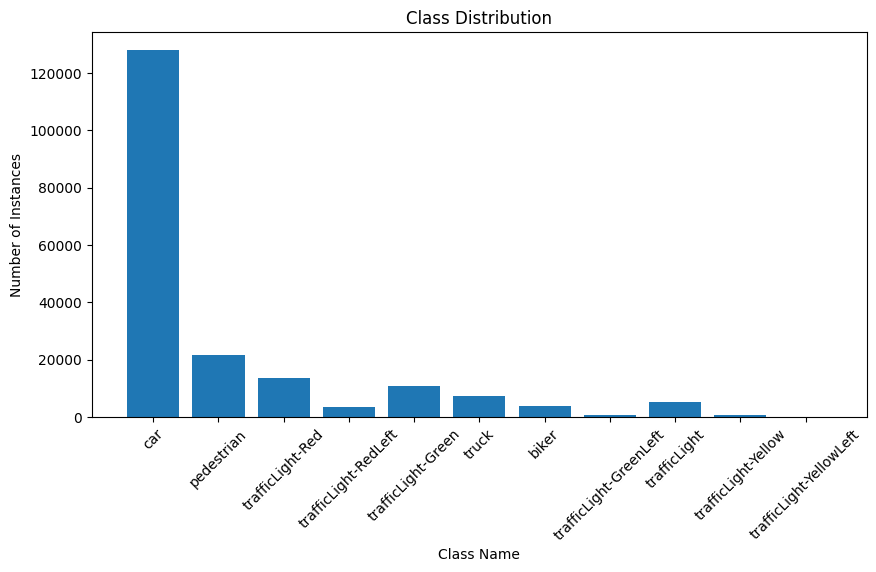

In [19]:
print("🔍 Analyzing Class Distribution...")
class_counts = Counter(ann['category_id'] for ann in data['annotations'])

# Map category IDs to names
class_names = {cat['id']: cat['name'] for cat in data['categories']}

# Plot the class distribution
plt.figure(figsize=(10, 5))
plt.bar([class_names[cid] for cid in class_counts.keys()], class_counts.values())
plt.title("Class Distribution")
plt.xlabel("Class Name")
plt.ylabel("Number of Instances")
plt.xticks(rotation=45)
plt.show()


size checker

In [ ]:
# Image Dimension Analysis
print("\n📏 Analyzing Image Dimensions...")
dimensions = []
for img in data['images']:
    dimensions.append((img['width'], img['height']))

# Display common dimensions
dim_counts = Counter(dimensions)
print("Most common dimensions:")
for dim, count in dim_counts.most_common(5):
    print(f"Dimensions: {dim}, Count: {count}")


📏 Analyzing Image Dimensions...
Most common dimensions:
Dimensions: (512, 512), Count: 26300


Quality Checker

In [ ]:
print("\n Image Quality checking")
low_quality = [img for img in data['images'] if img['width'] < 300 or img['height'] < 300]
print(f"Number of low-quality images (resolution < 300x300): {len(low_quality)}")
if low_quality:
    print("Sample low-quality images:", [img['file_name'] for img in low_quality[:5]])


 Image Quality checking
Number of low-quality images (resolution < 300x300): 0


more visualizations

In [ ]:
import random
import matplotlib.pyplot as plt
import cv2
from PIL import Image, ImageDraw
import pandas as pd
import numpy as np
import seaborn as sns
from IPython.display import display

# Display settings for better visuals
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 14})

# Load the updated COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

In [ ]:
# Helper function to plot images with bounding boxes
def plot_image_with_boxes(image_path, annotations):
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    for ann in annotations:
        bbox = ann['bbox']
        x, y, width, height = bbox
        x2, y2 = x + width, y + height
        label = class_names[ann['category_id']]
        # Draw bounding box
        draw.rectangle([x, y, x2, y2], outline="red", width=3)
        # Draw label with larger font size
        draw.text((x, y), label, fill="yellow", font=None, anchor=None, size=24)
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis("off")
    plt.show()


🖼️ Showing Random Samples with Bounding Boxes
Image: 1478900957671553561_jpg.rf.GZVdKZdkyUXLyD18XyCm.jpg


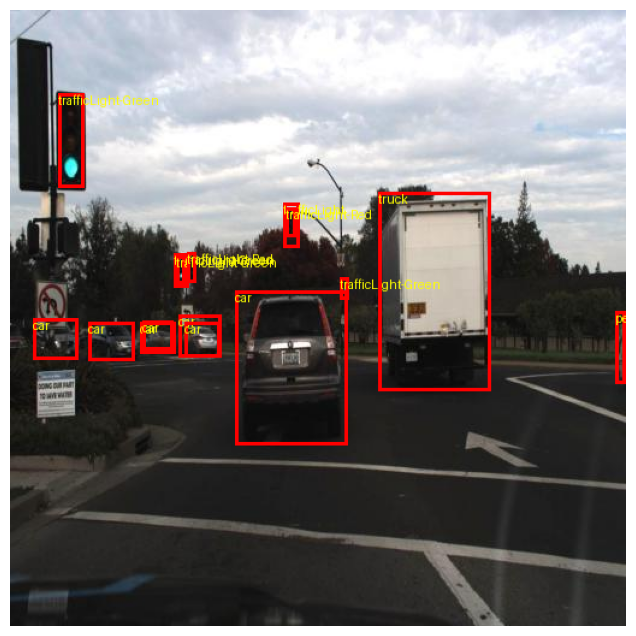

Image: 1478898098938399867_jpg.rf.o28rtqTW1Yc1p2Y9s66X.jpg


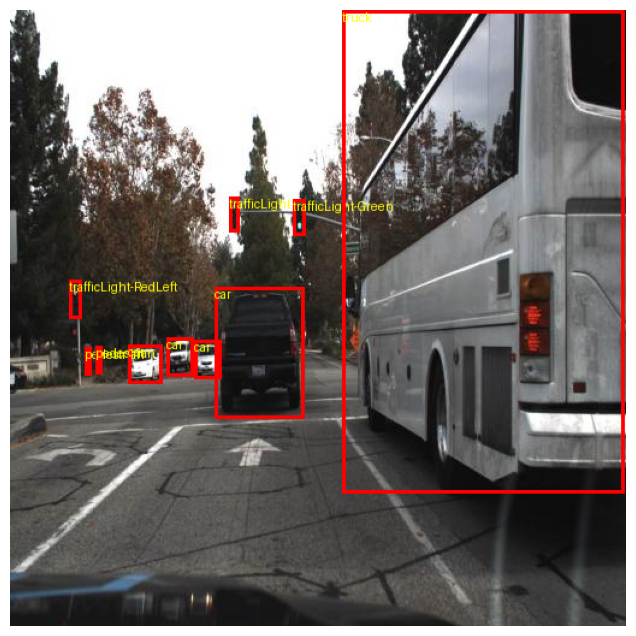

Image: 1478898890174690383_jpg.rf.JGodtNDvtFXJdeRJXbaR.jpg


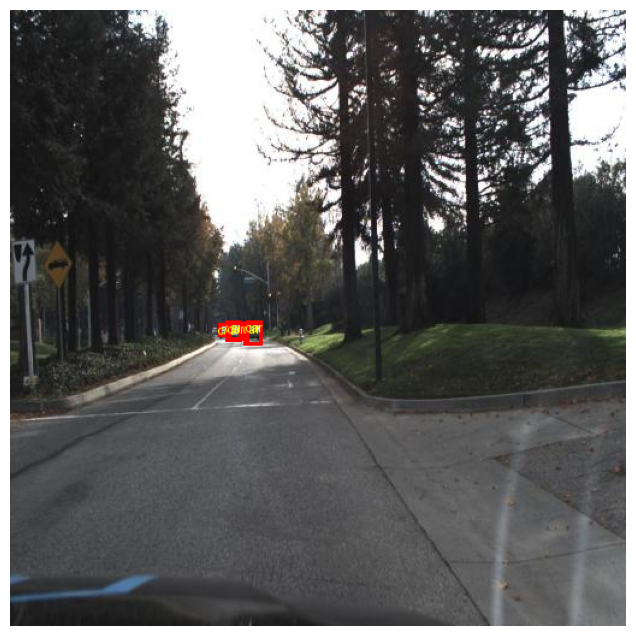

In [ ]:
print("\n🖼️ Showing Random Samples with Bounding Boxes")
sample_images = random.sample(data['images'], 3)  # Display 3 random images
for img in sample_images:
    image_path = os.path.join(images_path, img['file_name'])
    annotations = [ann for ann in data['annotations'] if ann['image_id'] == img['id']]
    print(f"Image: {img['file_name']}")
    plot_image_with_boxes(image_path, annotations)

Bounding Boxes Analysis


 Analyzing Bounding Boxes


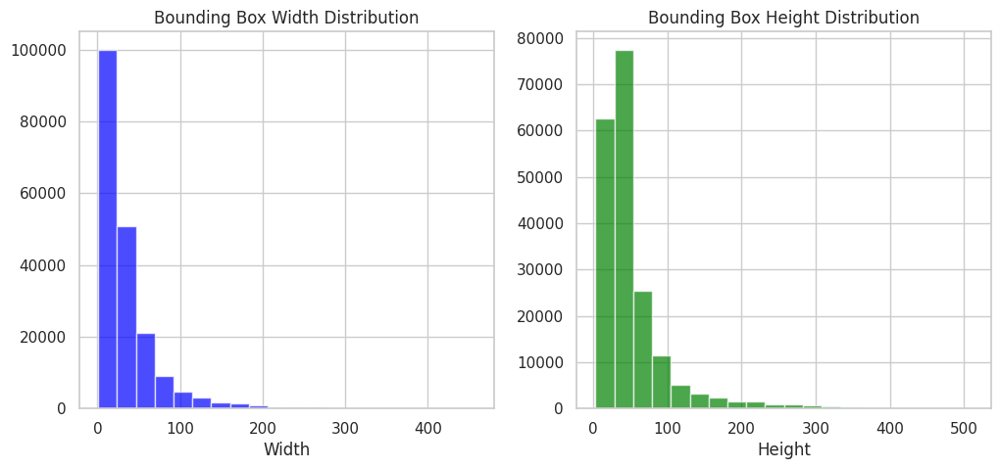

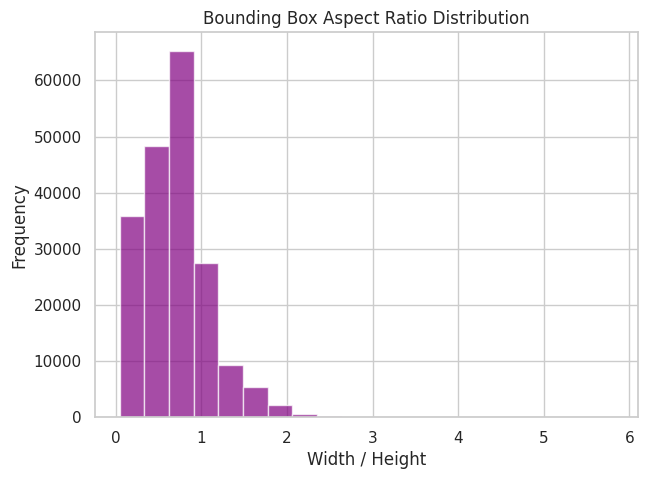

In [ ]:
print("\n Analyzing Bounding Boxes")
bbox_dims = [(ann['bbox'][2], ann['bbox'][3]) for ann in data['annotations']]
bbox_widths, bbox_heights = zip(*bbox_dims)

# Plot bounding box width and height distributions
plt.figure(figsize=(12, 5))

# Width Distribution
plt.subplot(1, 2, 1)
plt.hist(bbox_widths, bins=20, color='blue', alpha=0.7)
plt.title("Bounding Box Width Distribution")
plt.xlabel("Width")

# Height Distribution
plt.subplot(1, 2, 2)
plt.hist(bbox_heights, bins=20, color='green', alpha=0.7)
plt.title("Bounding Box Height Distribution")
plt.xlabel("Height")
plt.show()

# Aspect Ratio Analysis
aspect_ratios = [w / h for w, h in bbox_dims]
plt.figure(figsize=(7, 5))
plt.hist(aspect_ratios, bins=20, color='purple', alpha=0.7)
plt.title("Bounding Box Aspect Ratio Distribution")
plt.xlabel("Width / Height")
plt.ylabel("Frequency")
plt.show()

Spatial Distribution Analysis

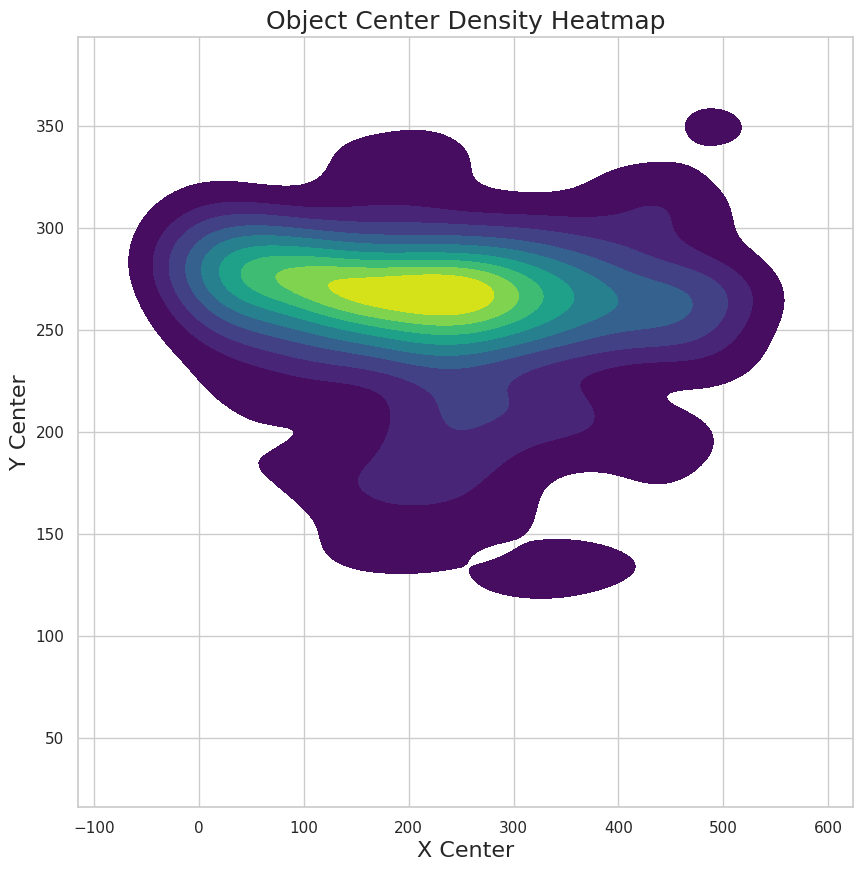

<ipython-input-26-fd36e0cfaa90>:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='class', y='width', palette='Set2')


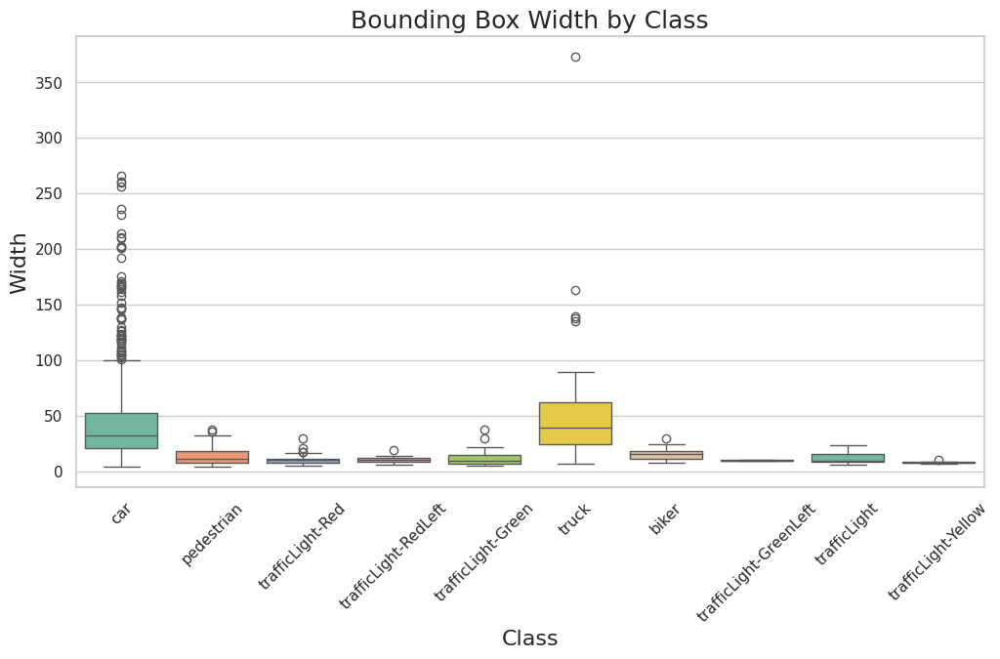

In [ ]:
def analyze_spatial_distribution(json_path=json_path, sample_size=1000):
    try:
        with open(json_path) as f:
            data = json.load(f)
    except FileNotFoundError:
        print(f"❌ Annotation file not found at {json_path}")
        return None

    # Prepare data
    spatial_data = []
    for ann in data['annotations'][:sample_size]:
        try:
            cat_name = next(c['name'] for c in data['categories'] if c['id'] == ann['category_id'])
            x, y, w, h = ann['bbox']
            spatial_data.append({
                'class': cat_name,
                'x_center': x + w / 2,
                'y_center': y + h / 2,
                'width': w,
                'height': h
            })
        except StopIteration:
            print(f"⚠️ Category ID {ann['category_id']} not found in categories")
            continue

    df = pd.DataFrame(spatial_data)
    if df.empty:
        print("❌ No valid annotations found.")
        return None

    # Spatial heatmap
    plt.figure(figsize=(10, 10))
    sns.kdeplot(data=df, x='x_center', y='y_center', fill=True, cmap='viridis')
    plt.title('Object Center Density Heatmap', fontsize=18)
    plt.xlabel('X Center', fontsize=16)
    plt.ylabel('Y Center', fontsize=16)
    plt.show()

    # Size distribution
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=df, x='class', y='width', palette='Set2')
    plt.title('Bounding Box Width by Class', fontsize=18)
    plt.xlabel('Class', fontsize=16)
    plt.ylabel('Width', fontsize=16)
    plt.xticks(rotation=45)
    plt.show()

    return df

# Run the analysis on the entire dataset
spatial_df = analyze_spatial_distribution()


Advanced Statistics Calculation

In [ ]:
def get_advanced_stats(data):
    class_counts = defaultdict(int)
    size_data = defaultdict(list)

    for ann in data['annotations']:
        try:
            cat_name = next(c['name'] for c in data['categories'] if c['id'] == ann['category_id'])
            class_counts[cat_name] += 1

            # Bounding box size
            width = ann['bbox'][2]
            height = ann['bbox'][3]
            size_data[cat_name].append(width * height)
        except StopIteration:
            continue

    # Create DataFrame - ensure numerical values
    df = pd.DataFrame({
        'class': list(class_counts.keys()),
        'count': list(class_counts.values()),
        'avg_size': [np.mean(size_data[c]) if size_data[c] else 0 for c in class_counts]
    }).sort_values('count', ascending=False)

    # Convert avg_size to float explicitly
    df['avg_size'] = df['avg_size'].astype(float)

    # Display with gradient coloring
    return df.style.background_gradient(cmap='Blues', subset=['count', 'avg_size']).format({
        'count': "{:d}",
        'avg_size': "{:.2f}"
    })

# Load the entire data
with open(json_path) as f:
    data = json.load(f)

# Display advanced statistics for the entire dataset
advanced_stats = get_advanced_stats(data)
display(advanced_stats)

,class,count,avg_size
0,car,127873,4087.01
1,pedestrian,21491,1426.20
2,trafficLight-Red,13673,396.76
4,trafficLight-Green,10838,308.70
5,truck,7194,8258.77
8,trafficLight,5101,630.62
6,biker,3704,1567.55
3,trafficLight-RedLeft,3482,308.63
7,trafficLight-GreenLeft,614,330.29
9,trafficLight-Yellow,541,347.25


Bias Detection and Visualization



🔍 Class Representation:


,class,count,percentage,avg_size
0,car,127873,65.731293,4087.007779
1,pedestrian,21491,11.047142,1426.195942
2,trafficLight-Red,13673,7.028411,396.755713
4,trafficLight-Green,10838,5.571119,308.702008
5,truck,7194,3.697973,8258.766767
8,trafficLight,5101,2.622096,630.617981
6,biker,3704,1.903988,1567.550964
3,trafficLight-RedLeft,3482,1.789872,308.634486
7,trafficLight-GreenLeft,614,0.315618,330.293338
9,trafficLight-Yellow,541,0.278093,347.246753


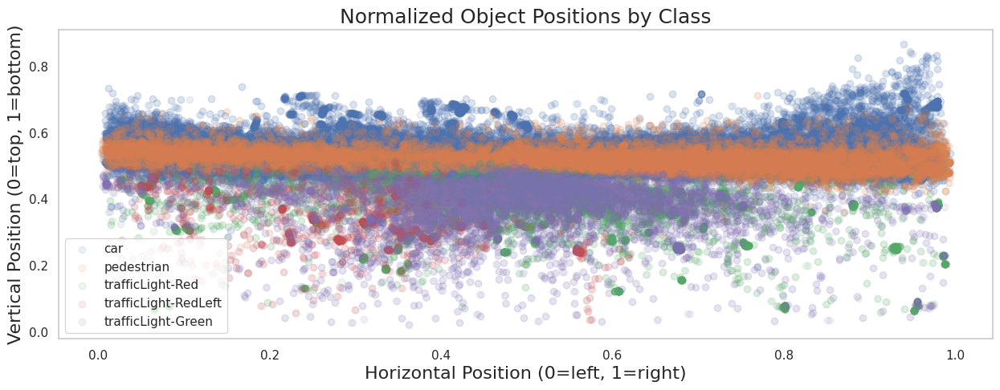

In [ ]:
def detect_biases(json_path=json_path):
    try:
        with open(json_path) as f:
            data = json.load(f)
    except FileNotFoundError:
        print(f"❌ Annotation file not found at {json_path}")
        return

    # Class distribution
    class_counts = {}
    size_dist = defaultdict(list)
    pos_dist = defaultdict(list)

    for ann in data['annotations']:
        try:
            cat_name = next(c['name'] for c in data['categories'] if c['id'] == ann['category_id'])
            class_counts[cat_name] = class_counts.get(cat_name, 0) + 1

            # Size distribution
            area = ann['bbox'][2] * ann['bbox'][3]
            size_dist[cat_name].append(area)

            # Position distribution
            img = next(i for i in data['images'] if i['id'] == ann['image_id'])
            x_center = (ann['bbox'][0] + ann['bbox'][2] / 2) / img['width']
            y_center = (ann['bbox'][1] + ann['bbox'][3] / 2) / img['height']
            pos_dist[cat_name].append((x_center, y_center))
        except StopIteration:
            continue

    # Class imbalance analysis
    df = pd.DataFrame({
        'class': list(class_counts.keys()),
        'count': list(class_counts.values()),
        'percentage': [100 * c / sum(class_counts.values()) for c in class_counts.values()],
        'avg_size': [np.mean(size_dist[k]) for k in class_counts]
    }).sort_values('count', ascending=False)

    print("\n🔍 Class Representation:")
    display(df.style.background_gradient(subset=['count', 'percentage'], cmap='YlOrRd'))

    # Positional bias visualization
    plt.figure(figsize=(15, 5))
    for i, (cls, positions) in enumerate(pos_dist.items()):
        if i >= 5: break  # Top 5 classes for clarity
        x, y = zip(*positions)
        plt.scatter(x, y, alpha=0.1, label=cls)

    plt.title('Normalized Object Positions by Class', fontsize=18)
    plt.xlabel('Horizontal Position (0=left, 1=right)', fontsize=16)
    plt.ylabel('Vertical Position (0=top, 1=bottom)', fontsize=16)
    plt.legend()
    plt.grid()
    plt.show()

# Run bias detection for the entire dataset
detect_biases()

Quality Metrics Analysis

In [ ]:
def advanced_quality_metrics(json_path=json_path):

    try:
        # Load annotations with error handling
        with open(json_path) as f:
            data = json.load(f)
    except Exception as e:
        print(f"❌ Error loading annotations: {e}")
        return

    metrics = {
        'images_with_small_objects': 0,
        'images_with_crowding': 0,
        'class_cooccurrence': defaultdict(int),
        'total_images_processed': 0
    }

    # Analyze images
    sample_images = data['images'][:min(1000, len(data['images']))]
    if not sample_images:
        print("❌ No images found in annotations")
        return

    for img in sample_images:
        metrics['total_images_processed'] += 1
        img_annots = [a for a in data['annotations'] if a['image_id'] == img['id']]
        if not img_annots:
            continue

        # Small objects check
        small_objs = sum((a['bbox'][2] * a['bbox'][3] < 32 * 32) for a in img_annots)
        if small_objs > 0:
            metrics['images_with_small_objects'] += 1

        # Crowding check
        if len(img_annots) > 10:
            metrics['images_with_crowding'] += 1

        # Class co-occurrence
        classes = {a['category_id'] for a in img_annots}
        if len(classes) > 1:
            for cls in classes:
                metrics['class_cooccurrence'][cls] += 1

    # Print the quality report
    print(f"\n🔍 Quality Report for the Entire Dataset:")
    print(f"Images processed: {metrics['total_images_processed']}")
    if metrics['total_images_processed'] > 0:
        print(f"- Images with small objects: {100 * metrics['images_with_small_objects'] / metrics['total_images_processed']:.1f}%")
        print(f"- Crowded images: {100 * metrics['images_with_crowding'] / metrics['total_images_processed']:.1f}%")
    else:
        print("❌ No valid images with annotations found")

    # Co-occurrence analysis
    if metrics['class_cooccurrence']:
        cooccur_data = []
        for cls, count in metrics['class_cooccurrence'].items():
            try:
                cat_name = next(c['name'] for c in data['categories'] if c['id'] == cls)
                cooccur_data.append((cat_name, count))
            except StopIteration:
                continue
        cooccur_df = pd.DataFrame(cooccur_data, columns=['Class', 'Co-occurrence Count']).sort_values('Co-occurrence Count', ascending=False)
        print("\n📊 Most Common Co-occurring Classes:")
        display(cooccur_df.head(10))
    else:
        print("❌ No multi-class images found in the sample")


advanced_quality_metrics()



🔍 Quality Report for the Entire Dataset:
Images processed: 1000
- Images with small objects: 90.5%
- Crowded images: 22.0%

📊 Most Common Co-occurring Classes:


,Class,Co-occurrence Count
0,car,569
1,pedestrian,262
2,trafficLight-Red,197
4,truck,177
5,trafficLight-Green,128
8,trafficLight,102
6,biker,88
3,trafficLight-RedLeft,86
7,trafficLight-GreenLeft,12
9,trafficLight-Yellow,8


REPORT

In [ ]:
# 1: Analyze Entire Dataset

def analyze_entire_dataset(base_path='/content/coco_dataset'):
    print(f"\n{'='*40}\n ANALYZING ENTIRE DATASET \n{'='*40}")

    # 1. Resolution Analysis
    print("\n RESOLUTION ANALYSIS")
    analyze_resolution(base_path)

    # 2. Class Distribution
    print("\n CLASS DISTRIBUTION")
    class_stats = analyze_class_distribution(base_path)

    # 3. Spatial Bias
    print("\n SPATIAL DISTRIBUTION")
    analyze_spatial_distribution(base_path)

    # 4. Advanced Metrics
    print("\n ADVANCED METRICS")
    advanced_quality_metrics(base_path)

In [ ]:
# 2: Resolution Analysis

def analyze_resolution(base_path):
    img_dir = images_path
    resolutions = []

    for img_file in os.listdir(img_dir)[:1000]:  # Sample
        with Image.open(os.path.join(img_dir, img_file)) as img:
            resolutions.append(img.size)

    resolutions = np.array(resolutions)

    stats = pd.DataFrame({
        'Average Width': [int(resolutions[:,0].mean())],
        'Average Height': [int(resolutions[:,1].mean())],
        'Min Width': [resolutions[:,0].min()],
        'Max Width': [resolutions[:,0].max()],
        'Aspect Ratio STD': [np.std(resolutions[:,0]/resolutions[:,1])]
    })
    display(stats.style.background_gradient(cmap='Blues'))


In [ ]:
# 3: Class Distribution Analysis

def analyze_class_distribution(base_path):
    with open(os.path.join(json_path)) as f:
        data = json.load(f)

    class_counts = defaultdict(int)
    for ann in data['annotations']:
        cat_name = next(c['name'] for c in data['categories'] if c['id'] == ann['category_id'])
        class_counts[cat_name] += 1

    df = pd.DataFrame({
        'Class': list(class_counts.keys()),
        'Count': list(class_counts.values()),
        '% of Total': [100 * x / sum(class_counts.values()) for x in class_counts.values()]
    }).sort_values('Count', ascending=False)

    display(df.style.background_gradient(subset=['Count'], cmap='YlOrRd'))
    return df


In [ ]:
# 4: Spatial Distribution Analysis

def analyze_spatial_distribution(base_path):
    with open(os.path.join(json_path)) as f:
        data = json.load(f)

    positions = []
    for ann in data['annotations'][:2000]:  # Sample
        img = next(i for i in data['images'] if i['id'] == ann['image_id'])
        x = (ann['bbox'][0] + ann['bbox'][2]/2) / img['width']
        y = (ann['bbox'][1] + ann['bbox'][3]/2) / img['height']
        positions.append([x, y])

    positions = np.array(positions)
    plt.figure(figsize=(10,5))
    plt.hist2d(positions[:,0], positions[:,1], bins=50, cmap='hot')
    plt.colorbar()
    plt.title('Object Position Heatmap (Normalized Coordinates)')
    plt.xlabel('Horizontal Position (0=left, 1=right)')
    plt.ylabel('Vertical Position (0=top, 1=bottom)')
    plt.show()


In [ ]:
# 5: Advanced Metrics Analysis

def advanced_quality_metrics(base_path):
    with open(json_path) as f:
        data = json.load(f)

    metrics = {
        'Small Objects (<32px)': 0,
        'Oversized Objects': 0,
        'Edge Cases': 0
    }

    for ann in data['annotations'][:5000]:  # Sample
        area = ann['bbox'][2] * ann['bbox'][3]
        img = next(i for i in data['images'] if i['id'] == ann['image_id'])

        # Small objects
        if area < 32*32:
            metrics['Small Objects (<32px)'] += 1

        # Edge cases
        x1, y1 = ann['bbox'][0], ann['bbox'][1]
        x2, y2 = x1 + ann['bbox'][2], y1 + ann['bbox'][3]
        if (x1 <= 2 or y1 <= 2 or x2 >= img['width']-2 or y2 >= img['height']-2):
            metrics['Edge Cases'] += 1

    total = len(data['annotations'][:5000])
    for k in metrics:
        metrics[k] = f"{100 * metrics[k] / total:.1f}%"

    display(pd.DataFrame([metrics]))


 ANALYZING ENTIRE DATASET 

 RESOLUTION ANALYSIS


,Average Width,Average Height,Min Width,Max Width,Aspect Ratio STD
0,512,512,512,512,0.000000



 CLASS DISTRIBUTION


,Class,Count,% of Total
0,car,127873,65.731293
1,pedestrian,21491,11.047142
2,trafficLight-Red,13673,7.028411
4,trafficLight-Green,10838,5.571119
5,truck,7194,3.697973
8,trafficLight,5101,2.622096
6,biker,3704,1.903988
3,trafficLight-RedLeft,3482,1.789872
7,trafficLight-GreenLeft,614,0.315618
9,trafficLight-Yellow,541,0.278093



 SPATIAL DISTRIBUTION


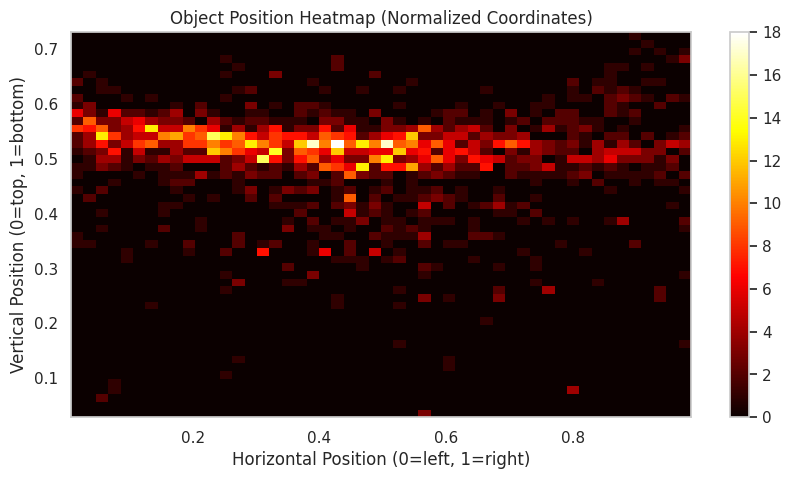


 ADVANCED METRICS


,Small Objects (<32px),Oversized Objects,Edge Cases
0,57.7%,0.0%,8.1%


In [ ]:
#Run Full Dataset Analysis
analyze_entire_dataset()

will do later after splitting if needed

# **Creating a subset for training**

In [20]:
import json
import random
import shutil
import os

# Paths
coco_json_path = 'coco_dataset/_annotations.coco.json'
subset_dir = 'coco_dataset/subset'
os.makedirs(subset_dir, exist_ok=True)

# Load original JSON
with open(coco_json_path) as f:
    coco = json.load(f)

# Subset size (e.g., 200 images)
subset_size = 200
all_images = coco['images']
subset_images = random.sample(all_images, subset_size)
subset_image_ids = {img['id'] for img in subset_images}

# Filter annotations
subset_annotations = [ann for ann in coco['annotations'] if ann['image_id'] in subset_image_ids]

# Create new subset JSON
subset_json = {
    'info': coco['info'],
    'licenses': coco['licenses'],
    'categories': coco['categories'],
    'images': subset_images,
    'annotations': subset_annotations
}

# Save subset JSON
with open(f'{subset_dir}/annotations.coco.json', 'w') as f:
    json.dump(subset_json, f)

# Copy images to subset folder
for img in subset_images:
    shutil.copy(f"coco_dataset/export/{img['file_name']}", f"{subset_dir}/{img['file_name']}")


### **spliting dataset**

In [21]:
from sklearn.model_selection import train_test_split

train_imgs, temp_imgs = train_test_split(subset_images, train_size=0.75, random_state=42)
val_imgs, test_imgs = train_test_split(temp_imgs, test_size=0.4, random_state=42)

splits = {
    'train': train_imgs,
    'val': val_imgs,
    'test': test_imgs
}

for split, imgs in splits.items():
    split_dir = f'coco_dataset/yolo_format/images/{split}'
    os.makedirs(split_dir, exist_ok=True)
    for img in imgs:
        shutil.copy(f"{subset_dir}/{img['file_name']}", f"{split_dir}/{img['file_name']}")


# **coverting to YOLO format**

In [22]:
def coco_to_yolo_bbox(bbox, img_w, img_h):
    x, y, w, h = bbox
    x_c = (x + w / 2) / img_w
    y_c = (y + h / 2) / img_h
    w /= img_w
    h /= img_h
    return [x_c, y_c, w, h]

# Build annotations by image_id
from collections import defaultdict
anns_by_img = defaultdict(list)
for ann in subset_annotations:
    anns_by_img[ann['image_id']].append(ann)

# Export YOLO labels
for split, imgs in splits.items():
    label_dir = f'coco_dataset/yolo_format/labels/{split}'
    os.makedirs(label_dir, exist_ok=True)

    for img in imgs:
        file_name = img['file_name'].rsplit('.', 1)[0]
        label_path = f"{label_dir}/{file_name}.txt"
        lines = []

        for ann in anns_by_img[img['id']]:
            yolo_box = coco_to_yolo_bbox(ann['bbox'], img['width'], img['height'])
            line = f"{ann['category_id']} " + " ".join(map(str, yolo_box))
            lines.append(line)

        with open(label_path, 'w') as f:
            f.write("\n".join(lines))


In [ ]:
"""
required

coco_dataset/
├── yolo_format/
│   ├── images/
│   │   ├── train/
│   │   ├── val/
│   │   └── test/
│   └── labels/
│       ├── train/
│       ├── val/
│       └── test/
├── data.yaml

"""

'\nrequired \n\ncoco_dataset/\n├── yolo_format/\n│   ├── images/\n│   │   ├── train/\n│   │   ├── val/\n│   │   └── test/\n│   └── labels/\n│       ├── train/\n│       ├── val/\n│       └── test/\n├── data.yaml\n\n'

In [23]:
yaml_content = '''
path: coco_dataset/yolo_format
train: images/train
val: images/val
test: images/test

nc: 12
names:
  - obstacles
  - biker
  - car
  - pedestrian
  - trafficLight
  - trafficLight-Green
  - trafficLight-GreenLeft
  - trafficLight-Red
  - trafficLight-RedLeft
  - trafficLight-Yellow
  - trafficLight-YellowLeft
  - truck
'''

with open('/content/coco_dataset/data.yaml', 'w') as f:
    f.write(yaml_content)



In [24]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 58.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 63.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 49.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 42.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [25]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt')  # Use 'yolov8s.pt', 'yolov8m.pt', etc. for larger models
model.train(
    data='/content/coco_dataset/data.yaml',
    epochs=120,
    imgsz=640,             # ↑ Increased image size (better for small objects)
    batch=16,              # Adjust based on your GPU's memory
    augment=True,          # Enable default augmentations
    patience=20,           # Early stopping if no improvement for 10 epochs
    lr0=0.001,             # Initial learning rate (try 0.01 or 0.001)
    optimizer='SGD',       # Try SGD (or 'Adam' if you want faster but less stable training)
    dropout=0.1,           # Helps regularize overfitting (optional)
    cache=True,            # Cache data for faster training
    hsv_h=0.015,           # Adjust color augmentation (Hue)
    hsv_s=0.7,
    hsv_v=0.4,
    degrees=10,            # Random rotation
    translate=0.1,         # Image translation
    scale=0.5,             # Zoom in/out
    shear=2.0,             # Shear images
    perspective=0.0,       # Less distortion
    mosaic=1.0,            # Strong mosaic augmentation
    mixup=0.2,             # Mild mixup for regularization
    workers=8,             # Parallel data loading
    project='yolov8-training',
    name='exp_augmented_50e',
    exist_ok=True          # Avoid overwrite errors
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 99.9MB/s]


Ultralytics 8.3.134 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/coco_dataset/data.yaml, degrees=10, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.1, dynamic=False, embed=None, epochs=120, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.2, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=exp_augmented_50e, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, patience=20, perspective=0.0, plots=True, pose=12.0,

100%|██████████| 755k/755k [00:00<00:00, 51.6MB/s]

Overriding model.yaml nc=80 with nc=12

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

 22        [15, 18, 21]  1    753652  ultralytics.nn.modules.head.Detect           [12, [64, 128, 256]]          
Model summary: 129 layers, 3,013,188 parameters, 3,013,172 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 190MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 18.3±5.5 MB/s, size: 34.3 KB)


train: Scanning /content/coco_dataset/yolo_format/labels/train... 150 images, 0 backgrounds, 0 corrupt: 100%|██████████| 150/150 [00:00<00:00, 586.97it/s]

train: New cache created: /content/coco_dataset/yolo_format/labels/train.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.2GB RAM): 100%|██████████| 150/150 [00:00<00:00, 303.25it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 11.5±2.9 MB/s, size: 34.0 KB)


val: Scanning /content/coco_dataset/yolo_format/labels/val... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<00:00, 318.19it/s]

val: New cache created: /content/coco_dataset/yolo_format/labels/val.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.0GB RAM): 100%|██████████| 30/30 [00:00<00:00, 109.31it/s]


Plotting labels to yolov8-training/exp_augmented_50e/labels.jpg... 
optimizer: SGD(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to yolov8-training/exp_augmented_50e
Starting training for 120 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/120      2.23G       2.26      4.539      1.553         56        640: 100%|██████████| 10/10 [00:06<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]

                   all         30        207    0.00712     0.0873     0.0194     0.0143

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      2/120       2.5G      2.123      4.448      1.517         67        640: 100%|██████████| 10/10 [00:02<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         30        207    0.00449     0.0873     0.0186     0.0134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/120      2.52G      2.014      4.345      1.482         43        640: 100%|██████████| 10/10 [00:02<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

                   all         30        207     0.0048     0.0873     0.0202     0.0143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/120      2.53G      1.989      4.244      1.462         68        640: 100%|██████████| 10/10 [00:03<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

                   all         30        207    0.00458     0.0887     0.0223     0.0153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/120      2.54G      1.865      4.021      1.381         59        640: 100%|██████████| 10/10 [00:02<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

                   all         30        207    0.00487      0.114      0.026     0.0164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      6/120      2.55G      1.874      3.833      1.348         94        640: 100%|██████████| 10/10 [00:02<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all         30        207    0.00517      0.141     0.0462     0.0212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/120      2.56G      1.865      3.617      1.333         34        640: 100%|██████████| 10/10 [00:02<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

                   all         30        207    0.00536      0.131     0.0431     0.0194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/120      2.58G      1.928      3.316      1.384         56        640: 100%|██████████| 10/10 [00:02<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

                   all         30        207      0.953     0.0343     0.0453      0.019



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/120      2.59G      1.873      3.036      1.372         55        640: 100%|██████████| 10/10 [00:03<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

                   all         30        207      0.964      0.046     0.0591     0.0258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/120       2.6G      1.856      2.943      1.331         86        640: 100%|██████████| 10/10 [00:02<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         30        207      0.976     0.0495     0.0716     0.0356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/120      2.61G       1.82      2.516       1.33         94        640: 100%|██████████| 10/10 [00:02<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

                   all         30        207      0.974     0.0583     0.0744      0.039



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/120      2.62G      1.754      2.392      1.366         52        640: 100%|██████████| 10/10 [00:02<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         30        207      0.972     0.0587     0.0768     0.0374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/120      2.63G       1.79      2.466      1.343         70        640: 100%|██████████| 10/10 [00:04<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

                   all         30        207      0.969     0.0613     0.0727     0.0365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/120      2.64G      1.812      2.436      1.399         38        640: 100%|██████████| 10/10 [00:02<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all         30        207      0.969      0.062      0.077     0.0393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/120      2.66G      1.793       2.29      1.381         69        640: 100%|██████████| 10/10 [00:02<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

                   all         30        207      0.965     0.0616     0.0887     0.0474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/120      2.67G       1.79      2.342      1.368         51        640: 100%|██████████| 10/10 [00:03<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

                   all         30        207      0.975     0.0599      0.114     0.0621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/120      2.68G      1.778      2.387      1.333         29        640: 100%|██████████| 10/10 [00:02<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all         30        207       0.97      0.062      0.129     0.0713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/120      2.69G      1.764      2.223      1.374         83        640: 100%|██████████| 10/10 [00:02<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

                   all         30        207      0.869      0.121      0.143     0.0814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/120       2.7G      1.776      2.213      1.326         62        640: 100%|██████████| 10/10 [00:02<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

                   all         30        207      0.841      0.125      0.139     0.0789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/120      2.71G      1.755      2.112      1.336         78        640: 100%|██████████| 10/10 [00:02<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

                   all         30        207      0.878      0.115      0.153     0.0867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/120      2.72G      1.704      2.064      1.301         41        640: 100%|██████████| 10/10 [00:03<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

                   all         30        207      0.889      0.109      0.159     0.0851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/120      2.74G      1.679      1.949       1.29         38        640: 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]

                   all         30        207      0.863      0.124      0.158     0.0765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/120      2.75G      1.799       2.12      1.335         37        640: 100%|██████████| 10/10 [00:03<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]

                   all         30        207      0.631      0.146      0.156     0.0722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/120      2.76G      1.738      1.958      1.317         70        640: 100%|██████████| 10/10 [00:03<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

                   all         30        207      0.629       0.16      0.161       0.08



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/120      2.77G      1.748       1.97      1.323         61        640: 100%|██████████| 10/10 [00:03<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

                   all         30        207      0.653       0.14      0.171      0.086



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/120      2.78G      1.682      1.905      1.268         72        640: 100%|██████████| 10/10 [00:04<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

                   all         30        207      0.687      0.134      0.165     0.0836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/120      2.79G      1.714      1.886      1.318         85        640: 100%|██████████| 10/10 [00:02<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all         30        207      0.692      0.139      0.163     0.0824

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     28/120       2.8G      1.733      1.802      1.306         63        640: 100%|██████████| 10/10 [00:02<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         30        207      0.521      0.247      0.176     0.0889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/120      2.82G      1.645      1.808      1.255         59        640: 100%|██████████| 10/10 [00:02<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

                   all         30        207      0.435      0.262      0.188     0.0947



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/120      2.83G      1.716       1.86      1.299        100        640: 100%|██████████| 10/10 [00:02<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

                   all         30        207      0.567      0.199      0.184     0.0957



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/120      2.84G       1.73       1.85      1.308         56        640: 100%|██████████| 10/10 [00:03<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

                   all         30        207      0.474      0.285        0.2      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/120      2.85G       1.65      1.751      1.276         45        640: 100%|██████████| 10/10 [00:02<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

                   all         30        207      0.482      0.246      0.199      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/120      2.86G      1.668      1.773      1.273        101        640: 100%|██████████| 10/10 [00:02<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

                   all         30        207      0.472      0.264      0.204      0.109

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     34/120      2.88G       1.63      1.703      1.231         53        640: 100%|██████████| 10/10 [00:02<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

                   all         30        207      0.488      0.339      0.205      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/120      2.88G       1.68      1.741      1.257         69        640: 100%|██████████| 10/10 [00:03<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

                   all         30        207       0.48      0.327      0.202      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/120       2.9G      1.672      1.714      1.248         64        640: 100%|██████████| 10/10 [00:03<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         30        207       0.47       0.31      0.202      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/120      2.91G       1.67      1.706      1.274        109        640: 100%|██████████| 10/10 [00:02<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

                   all         30        207      0.479      0.338      0.199      0.107

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     38/120      2.92G      1.702      1.733      1.315         67        640: 100%|██████████| 10/10 [00:02<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

                   all         30        207      0.503      0.315      0.206       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/120      2.93G      1.658      1.695      1.273         56        640: 100%|██████████| 10/10 [00:02<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         30        207      0.485      0.278      0.204      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/120      2.94G      1.655      1.672      1.297         58        640: 100%|██████████| 10/10 [00:03<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]

                   all         30        207       0.48      0.278      0.208      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/120      2.95G      1.666      1.682      1.297         40        640: 100%|██████████| 10/10 [00:02<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

                   all         30        207      0.385      0.334      0.224      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/120      2.96G      1.639      1.717      1.275         70        640: 100%|██████████| 10/10 [00:02<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

                   all         30        207      0.388      0.308      0.211      0.107

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     43/120      2.98G      1.605       1.69      1.252         40        640: 100%|██████████| 10/10 [00:02<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

                   all         30        207      0.497      0.312      0.214      0.109

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     44/120      2.99G      1.702      1.741      1.296        113        640: 100%|██████████| 10/10 [00:02<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

                   all         30        207      0.512      0.299      0.213      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/120         3G      1.607      1.572      1.223         61        640: 100%|██████████| 10/10 [00:02<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

                   all         30        207      0.525       0.34      0.214       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/120      3.01G       1.59      1.619      1.228         84        640: 100%|██████████| 10/10 [00:02<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all         30        207      0.526      0.358      0.221      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/120      3.02G      1.613      1.658      1.247        116        640: 100%|██████████| 10/10 [00:02<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         30        207      0.521       0.37      0.216       0.11

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     48/120      3.04G       1.62      1.712      1.229         30        640: 100%|██████████| 10/10 [00:02<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

                   all         30        207      0.524      0.308      0.214      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/120      3.04G      1.662       1.66      1.254         85        640: 100%|██████████| 10/10 [00:03<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

                   all         30        207      0.529      0.344      0.213      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/120      3.06G      1.621      1.671      1.269         73        640: 100%|██████████| 10/10 [00:02<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

                   all         30        207      0.499      0.357      0.221      0.109

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     51/120      3.07G      1.657      1.696      1.246         38        640: 100%|██████████| 10/10 [00:02<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         30        207      0.494      0.318      0.222       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/120      3.08G      1.581      1.508      1.233         92        640: 100%|██████████| 10/10 [00:02<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

                   all         30        207      0.507      0.339      0.223      0.106

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     53/120      3.09G      1.603      1.595       1.23         74        640: 100%|██████████| 10/10 [00:03<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]

                   all         30        207      0.513      0.302      0.226      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/120       3.1G      1.636      1.648      1.284         65        640: 100%|██████████| 10/10 [00:02<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

                   all         30        207      0.512      0.306      0.223      0.105

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     55/120      3.11G      1.576       1.59      1.226         93        640: 100%|██████████| 10/10 [00:02<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

                   all         30        207      0.512      0.312      0.226      0.107

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     56/120      3.12G      1.591       1.54      1.222         65        640: 100%|██████████| 10/10 [00:02<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

                   all         30        207      0.428       0.33      0.234      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/120      3.14G      1.664      1.665      1.247         61        640: 100%|██████████| 10/10 [00:02<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

                   all         30        207      0.432      0.369      0.233      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/120      3.15G      1.518      1.511      1.201         62        640: 100%|██████████| 10/10 [00:02<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all         30        207      0.417      0.337      0.219       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/120      3.16G      1.597      1.657      1.248         38        640: 100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

                   all         30        207      0.412      0.301      0.217      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/120      3.17G       1.61      1.586      1.235         80        640: 100%|██████████| 10/10 [00:02<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         30        207        0.4      0.317      0.221      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/120      3.18G      1.626      1.589      1.243         80        640: 100%|██████████| 10/10 [00:02<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         30        207      0.643       0.21      0.223      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/120       3.2G      1.631      1.668      1.241         88        640: 100%|██████████| 10/10 [00:03<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

                   all         30        207      0.479      0.246       0.22       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/120      3.21G      1.573      1.543      1.214         73        640: 100%|██████████| 10/10 [00:02<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

                   all         30        207      0.466      0.244      0.215      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/120      3.22G      1.593      1.589      1.243         48        640: 100%|██████████| 10/10 [00:02<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

                   all         30        207      0.408      0.321      0.209      0.107

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     65/120      3.23G       1.55      1.518      1.236         88        640: 100%|██████████| 10/10 [00:02<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all         30        207      0.589      0.226      0.214       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/120      3.24G      1.572       1.53      1.215         71        640: 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

                   all         30        207      0.695      0.214      0.216      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/120      3.25G      1.604      1.556      1.234         92        640: 100%|██████████| 10/10 [00:02<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all         30        207      0.391      0.308      0.221      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/120      3.26G      1.573        1.6      1.221         46        640: 100%|██████████| 10/10 [00:02<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

                   all         30        207      0.391      0.315      0.206      0.107

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     69/120      3.27G      1.576      1.547      1.233         62        640: 100%|██████████| 10/10 [00:02<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         30        207      0.423      0.297      0.222      0.115

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     70/120      3.29G      1.559      1.555      1.192         33        640: 100%|██████████| 10/10 [00:02<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

                   all         30        207      0.401      0.304      0.218      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/120       3.3G      1.578      1.509      1.231         48        640: 100%|██████████| 10/10 [00:03<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

                   all         30        207      0.511      0.303      0.225      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/120      3.31G      1.593      1.575      1.251        102        640: 100%|██████████| 10/10 [00:02<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all         30        207      0.403      0.329      0.222      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/120      3.32G      1.617       1.57      1.234        126        640: 100%|██████████| 10/10 [00:02<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

                   all         30        207      0.394      0.335      0.226      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/120      3.33G      1.558      1.509      1.214         85        640: 100%|██████████| 10/10 [00:02<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

                   all         30        207      0.391      0.335      0.224       0.12

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     75/120      3.34G      1.563      1.522      1.201         61        640: 100%|██████████| 10/10 [00:02<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

                   all         30        207      0.393      0.359      0.234      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/120      3.36G      1.602      1.582      1.205        108        640: 100%|██████████| 10/10 [00:02<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all         30        207      0.395      0.359      0.235      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/120      3.37G      1.544      1.555      1.219        129        640: 100%|██████████| 10/10 [00:02<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all         30        207      0.394      0.358      0.221       0.11

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     78/120      3.38G      1.556      1.532      1.219         57        640: 100%|██████████| 10/10 [00:02<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

                   all         30        207      0.512      0.367      0.227       0.11

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     79/120      3.39G      1.594      1.535      1.202         55        640: 100%|██████████| 10/10 [00:02<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

                   all         30        207      0.512      0.352      0.225      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/120       3.4G      1.546      1.517      1.195         57        640: 100%|██████████| 10/10 [00:03<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

                   all         30        207      0.399      0.336      0.239      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/120      3.41G      1.552      1.522      1.236         56        640: 100%|██████████| 10/10 [00:02<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

                   all         30        207        0.5      0.336      0.237      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/120      3.42G      1.562      1.541      1.199         99        640: 100%|██████████| 10/10 [00:02<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]

                   all         30        207      0.792      0.194       0.24      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/120      3.43G      1.562      1.579       1.22         90        640: 100%|██████████| 10/10 [00:03<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

                   all         30        207      0.774      0.194      0.243      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/120      3.45G      1.554      1.529      1.218         77        640: 100%|██████████| 10/10 [00:03<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

                   all         30        207      0.756      0.197      0.245      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/120      3.46G      1.507      1.491      1.189         33        640: 100%|██████████| 10/10 [00:02<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all         30        207      0.717      0.205      0.241      0.121

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     86/120      3.47G      1.602      1.518      1.245         38        640: 100%|██████████| 10/10 [00:02<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

                   all         30        207      0.727      0.201      0.242      0.121

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     87/120      3.48G      1.506       1.48       1.21         56        640: 100%|██████████| 10/10 [00:02<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         30        207      0.722      0.192       0.24      0.119

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     88/120      3.49G      1.508       1.45      1.186         81        640: 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

                   all         30        207      0.568      0.219      0.229      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/120       3.5G      1.521      1.464      1.213         45        640: 100%|██████████| 10/10 [00:02<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all         30        207      0.706      0.214      0.231      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/120      3.51G      1.565      1.478      1.208         98        640: 100%|██████████| 10/10 [00:02<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

                   all         30        207      0.604      0.209      0.226       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/120      3.53G      1.581      1.463      1.217         64        640: 100%|██████████| 10/10 [00:02<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

                   all         30        207      0.486      0.359      0.227       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/120      3.54G      1.577      1.564      1.246        112        640: 100%|██████████| 10/10 [00:04<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]

                   all         30        207      0.491      0.342      0.231      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/120      3.55G      1.574       1.57      1.235        108        640: 100%|██████████| 10/10 [00:03<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

                   all         30        207      0.498      0.325      0.228       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/120      3.56G      1.569      1.555      1.231         72        640: 100%|██████████| 10/10 [00:03<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

                   all         30        207      0.569      0.218      0.225      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/120      3.57G      1.551      1.496      1.225         71        640: 100%|██████████| 10/10 [00:02<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

                   all         30        207      0.565      0.229      0.229      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/120      3.58G      1.596      1.526      1.205         88        640: 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

                   all         30        207      0.583      0.224      0.234      0.115

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     97/120      3.59G      1.522      1.484      1.189         83        640: 100%|██████████| 10/10 [00:02<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

                   all         30        207      0.579      0.227      0.231      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/120      3.61G      1.508      1.429      1.195         66        640: 100%|██████████| 10/10 [00:02<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all         30        207      0.584       0.23      0.233      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/120      3.62G       1.52      1.495      1.204         49        640: 100%|██████████| 10/10 [00:02<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

                   all         30        207      0.575      0.232      0.234      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/120      3.63G      1.563        1.5      1.219        126        640: 100%|██████████| 10/10 [00:03<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

                   all         30        207       0.57      0.237      0.228      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/120      3.64G      1.523      1.485      1.177         37        640: 100%|██████████| 10/10 [00:02<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

                   all         30        207      0.585      0.238      0.229      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/120      3.65G      1.547      1.489      1.213        121        640: 100%|██████████| 10/10 [00:02<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all         30        207      0.515      0.293      0.234      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/120      3.66G      1.531      1.497      1.201        137        640: 100%|██████████| 10/10 [00:02<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

                   all         30        207      0.522      0.297      0.233      0.115
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 83, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

103 epochs completed in 0.106 hours.


Optimizer stripped from yolov8-training/exp_augmented_50e/weights/last.pt, 6.3MB
Optimizer stripped from yolov8-training/exp_augmented_50e/weights/best.pt, 6.3MB

Validating yolov8-training/exp_augmented_50e/weights/best.pt...
Ultralytics 8.3.134 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,988 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


                   all         30        207      0.746      0.196      0.228      0.119
                 biker          2          3          1          0    0.00497    0.00298
                   car         30        137      0.842      0.664      0.757      0.397
            pedestrian          7         16      0.844       0.25      0.323      0.172
          trafficLight          4          5      0.426        0.2      0.191      0.101
    trafficLight-Green          4          7      0.573      0.143      0.215      0.104
trafficLight-GreenLeft          2          4          1          0          0          0
      trafficLight-Red          6         18      0.375      0.333      0.353      0.179
  trafficLight-RedLeft          5          5          1          0     0.0541     0.0319
   trafficLight-Yellow          1          4          1          0          0          0
                 truck          6          8      0.396      0.375      0.383        0.2
Speed: 0.2ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 11])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ca123257e10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.0460

# **evaluation matrics**

In [26]:
from ultralytics import YOLO

model = YOLO('yolov8-training/exp_augmented_50e/weights/best.pt')

# Evaluate on the test split (make sure test is defined in data.yaml)
metrics = model.val(data='coco_dataset/data.yaml', split='test')
print(metrics)


Ultralytics 8.3.134 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,988 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 108.2±133.6 MB/s, size: 39.3 KB)


val: Scanning /content/coco_dataset/yolo_format/labels/test... 20 images, 0 backgrounds, 0 corrupt: 100%|██████████| 20/20 [00:00<00:00, 835.21it/s]

val: New cache created: /content/coco_dataset/yolo_format/labels/test.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.94it/s]


                   all         20        159      0.324       0.56       0.41      0.189
                 biker          2          2      0.192        0.5      0.109     0.0716
                   car         20        102      0.514      0.686      0.706      0.364
            pedestrian          7         24      0.403      0.542      0.412      0.134
          trafficLight          2          3      0.129      0.333      0.271     0.0867
    trafficLight-Green          4          8      0.352      0.625      0.417      0.146
      trafficLight-Red          4          6      0.175      0.667       0.32      0.104
  trafficLight-RedLeft          4          6        0.3        0.5      0.377      0.174
                 truck          6          8      0.527      0.625       0.67      0.432
Speed: 5.3ms preprocess, 15.0ms inference, 0.0ms loss, 6.6ms postprocess per image
Results saved to runs/detect/val
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array

In [27]:
metrics = model.val(data='coco_dataset/data.yaml', split='val')


Ultralytics 8.3.134 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 787.7±208.9 MB/s, size: 30.8 KB)


val: Scanning /content/coco_dataset/yolo_format/labels/val.cache... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.40it/s]


                   all         30        207      0.773      0.194      0.244      0.125
                 biker          2          3          1          0          0          0
                   car         30        137      0.861      0.635      0.759      0.393
            pedestrian          7         16      0.791       0.25      0.321      0.174
          trafficLight          4          5      0.657        0.2       0.31       0.17
    trafficLight-Green          4          7      0.526      0.143      0.266      0.114
trafficLight-GreenLeft          2          4          1          0          0          0
      trafficLight-Red          6         18      0.483      0.333      0.397      0.211
  trafficLight-RedLeft          5          5          1          0     0.0652     0.0423
   trafficLight-Yellow          1          4          1          0          0          0
                 truck          6          8      0.408      0.375      0.318      0.148
Speed: 4.6ms preproce

In [28]:
results = model.predict(source='/content/coco_dataset/yolo_format/images/test', save=True, conf=0.25)



image 1/20 /content/coco_dataset/yolo_format/images/test/1478020790214714215_jpg.rf.49b87ba468e45e0dc92178409a89e1d3.jpg: 640x640 7 cars, 1 truck, 8.4ms
image 2/20 /content/coco_dataset/yolo_format/images/test/1478021909591329121_jpg.rf.zKpKy5HXYFlpU0aVh3YH.jpg: 640x640 12 cars, 8.5ms
image 3/20 /content/coco_dataset/yolo_format/images/test/1478895417875391449_jpg.rf.0b5853e6ae0bebfdb32942deeae8cd15.jpg: 640x640 2 cars, 8.2ms
image 4/20 /content/coco_dataset/yolo_format/images/test/1478896456480827778_jpg.rf.HqN3Nmiljah8Lkw1RkoY.jpg: 640x640 4 cars, 8.0ms
image 5/20 /content/coco_dataset/yolo_format/images/test/1478897889845435845_jpg.rf.DvvaL8FZTdQYRhcqSB2L.jpg: 640x640 8 cars, 3 trafficLight-Reds, 1 truck, 8.1ms
image 6/20 /content/coco_dataset/yolo_format/images/test/1478897942404804674_jpg.rf.GCavUsXM1Sgv2H0MKzeb.jpg: 640x640 5 cars, 3 pedestrians, 3 trafficLight-Reds, 1 truck, 8.2ms
image 7/20 /content/coco_dataset/yolo_format/images/test/1478898254329047575_jpg.rf.U3UD7YKMgWQsaD

In [29]:
import os

model_path = 'yolov8-training/exp_augmented_50e/weights/best.pt'

if os.path.exists(model_path):
    print("✅ Model found:", model_path)
else:
    print("❌ Model NOT found:", model_path)

✅ Model found: yolov8-training/exp_augmented_50e/weights/best.pt


In [30]:
from ultralytics import YOLO

model = YOLO('yolov8-training/exp_augmented_50e/weights/best.pt')

# Evaluate on the test split (make sure test is defined in data.yaml)
metrics = model.val(data='coco_dataset/data.yaml', split='test')
print(metrics)

Ultralytics 8.3.134 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,988 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 810.8±237.0 MB/s, size: 35.8 KB)


val: Scanning /content/coco_dataset/yolo_format/labels/test.cache... 20 images, 0 backgrounds, 0 corrupt: 100%|██████████| 20/20 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]


                   all         20        159      0.324       0.56       0.41      0.189
                 biker          2          2      0.192        0.5      0.109     0.0716
                   car         20        102      0.514      0.686      0.706      0.364
            pedestrian          7         24      0.403      0.542      0.412      0.134
          trafficLight          2          3      0.129      0.333      0.271     0.0867
    trafficLight-Green          4          8      0.352      0.625      0.417      0.146
      trafficLight-Red          4          6      0.175      0.667       0.32      0.104
  trafficLight-RedLeft          4          6        0.3        0.5      0.377      0.174
                 truck          6          8      0.527      0.625       0.67      0.432
Speed: 0.3ms preprocess, 11.2ms inference, 0.0ms loss, 5.1ms postprocess per image
Results saved to runs/detect/val3
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: arra

In [33]:
results = model.predict(source='/content/coco_dataset/yolo_format/images/test', save=True, conf=0.25)


image 1/20 /content/coco_dataset/yolo_format/images/test/1478020790214714215_jpg.rf.49b87ba468e45e0dc92178409a89e1d3.jpg: 640x640 7 cars, 1 truck, 26.4ms
image 2/20 /content/coco_dataset/yolo_format/images/test/1478021909591329121_jpg.rf.zKpKy5HXYFlpU0aVh3YH.jpg: 640x640 12 cars, 42.2ms
image 3/20 /content/coco_dataset/yolo_format/images/test/1478895417875391449_jpg.rf.0b5853e6ae0bebfdb32942deeae8cd15.jpg: 640x640 2 cars, 18.6ms
image 4/20 /content/coco_dataset/yolo_format/images/test/1478896456480827778_jpg.rf.HqN3Nmiljah8Lkw1RkoY.jpg: 640x640 4 cars, 11.9ms
image 5/20 /content/coco_dataset/yolo_format/images/test/1478897889845435845_jpg.rf.DvvaL8FZTdQYRhcqSB2L.jpg: 640x640 8 cars, 3 trafficLight-Reds, 1 truck, 17.1ms
image 6/20 /content/coco_dataset/yolo_format/images/test/1478897942404804674_jpg.rf.GCavUsXM1Sgv2H0MKzeb.jpg: 640x640 5 cars, 3 pedestrians, 3 trafficLight-Reds, 1 truck, 13.8ms
image 7/20 /content/coco_dataset/yolo_format/images/test/1478898254329047575_jpg.rf.U3UD7YKM

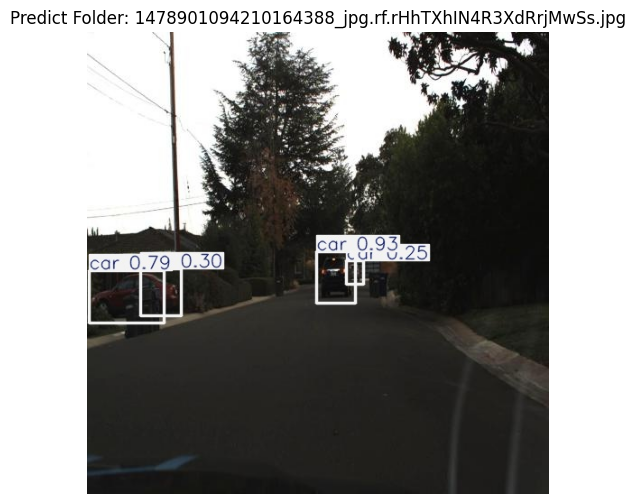

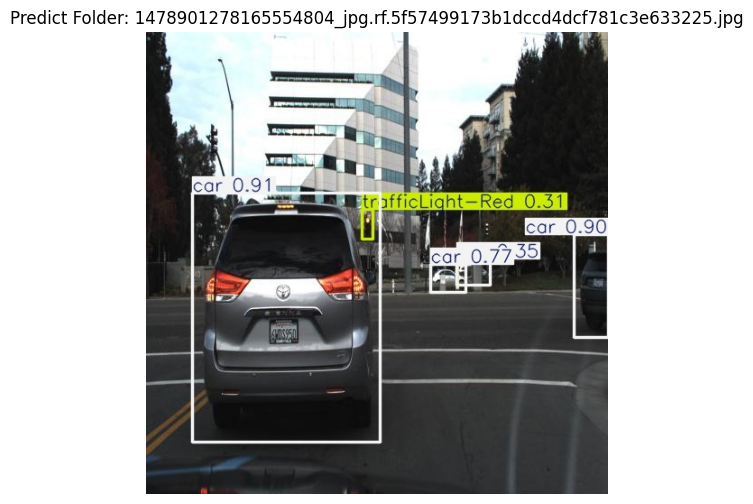

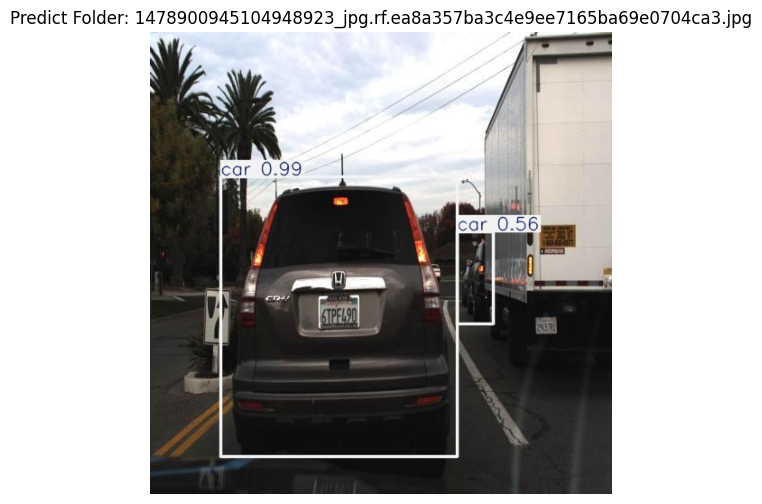

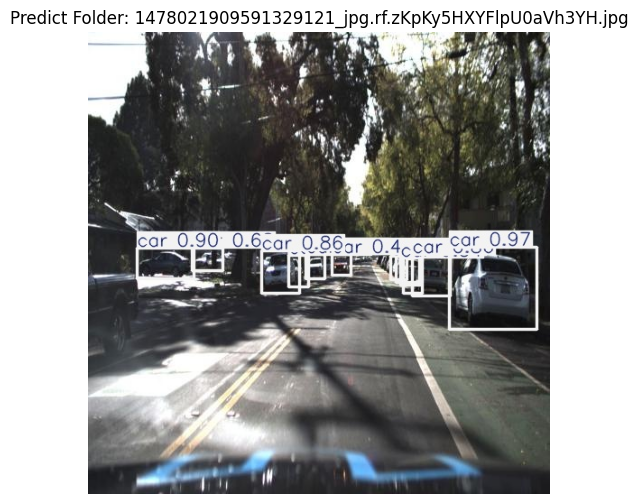

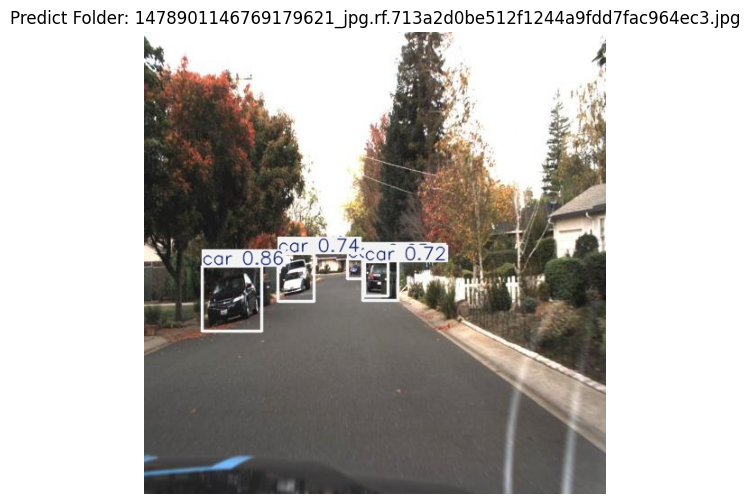

...

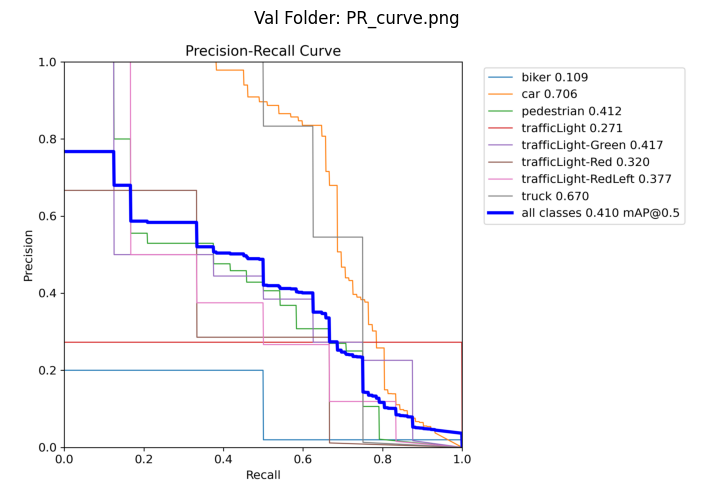

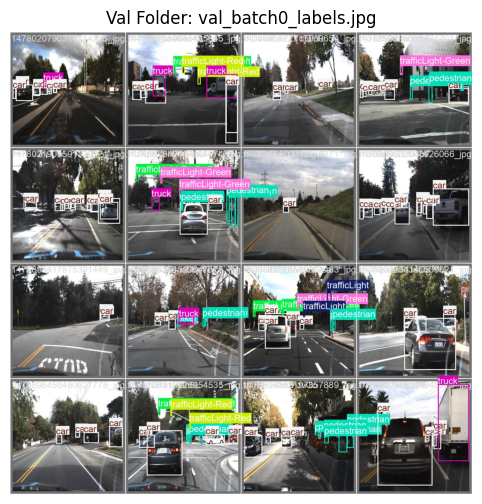

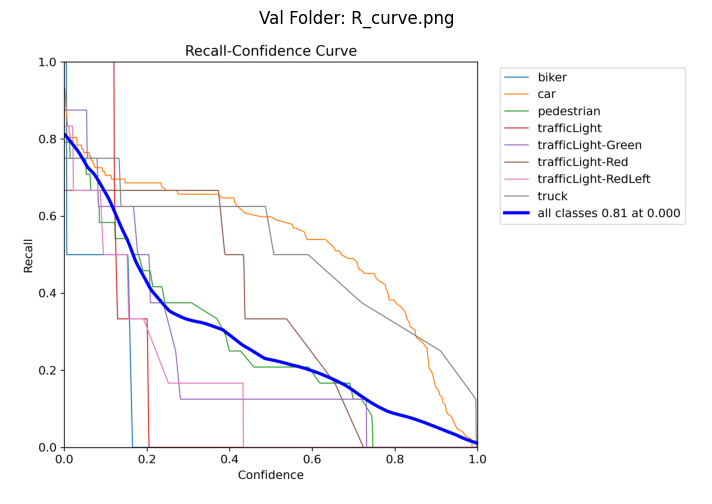

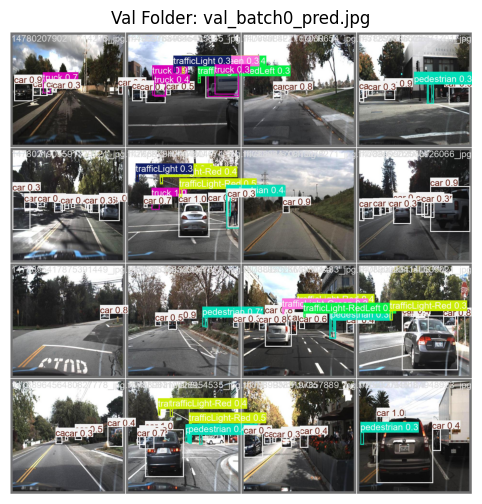

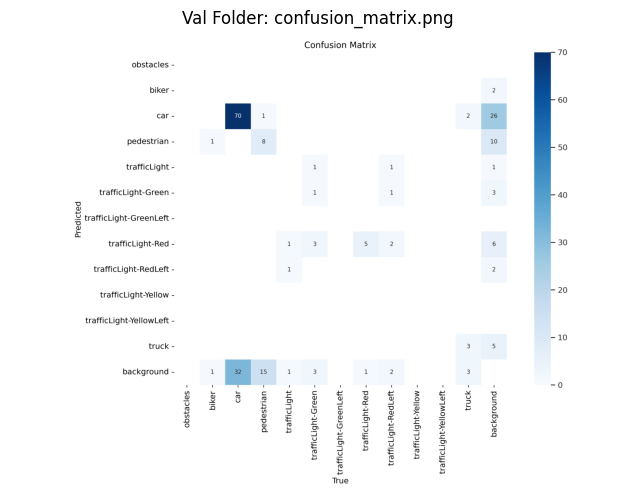

In [34]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images_one_by_one(folder_path, title):
    if not os.path.exists(folder_path):
        print(f"Folder '{folder_path}' does not exist.")
        return

    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    if not image_files:
        print(f"No images found in '{folder_path}'.")
        return

    for file in image_files:
        img_path = os.path.join(folder_path, file)
        img = Image.open(img_path)

        plt.figure(figsize=(10, 6))
        plt.imshow(img)
        plt.title(f"{title}: {file}")
        plt.axis('off')
        plt.show()

# Display images one by one from each folder
display_images_one_by_one('/content/runs/detect/predict2', 'Predict Folder')
display_images_one_by_one('/content/runs/detect/val3', 'Val Folder')

# **EXPORT MODEL**

In [36]:
import os

model_path = 'yolov8-training/exp_augmented_50e/weights/best.pt'

if os.path.exists(model_path):
    print("✅ Model found:", model_path)
else:
    print("❌ Model NOT found:", model_path)

✅ Model found: yolov8-training/exp_augmented_50e/weights/best.pt


In [37]:
import os
import shutil
import zipfile

# Paths
model_path = 'yolov8-training/exp_augmented_50e/weights/best.pt'
new_folder = 'yolov8-models'
zip_path = 'yolov8-models.zip'

# Check if the model exists
if os.path.exists(model_path):
    print("✅ Model found:", model_path)

    # Create the new folder if it doesn't exist
    if not os.path.exists(new_folder):
        os.makedirs(new_folder)

    # Move the model to the new folder
    new_model_path = os.path.join(new_folder, 'best.pt')
    shutil.move(model_path, new_model_path)
    print(f"✅ Model moved to: {new_model_path}")

    # Zip the new folder
    with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, dirs, files in os.walk(new_folder):
            for file in files:
                zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), new_folder))
    print(f"✅ Folder zipped to: {zip_path}")
else:
    print("❌ Model NOT found:", model_path)


✅ Model found: yolov8-training/exp_augmented_50e/weights/best.pt
✅ Model moved to: yolov8-models/best.pt
✅ Folder zipped to: yolov8-models.zip
